In [ ]:
import sys
from pathlib import Path

ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "paths.py").exists())
sys.path.insert(0, str(ROOT))
from paths import *


In [1]:
import os
import random
import shutil

import cv2
import numpy as np


Mounted at /content/drive


In [ ]:
# carried over from the last years detection project. the only part used downstream is
# crop_all() below, which pulls individual plants out of the NI H2020
# frames using the supplied yolo boxes. the 40x40 window sampling is left
# in because the preview cell at the bottom uses it.
HABITATS = ["screes", "dunes", "forests", "grasslands"]

habitat = ""
while habitat not in HABITATS:
    habitat = input(f"habitat {HABITATS}: ").strip().lower()
    if habitat not in HABITATS:
        print(f"'{habitat}' isn't one of {HABITATS}")

root = os.path.join(str(ROOT), "data/raw/nih2020", habitat)
img_train = os.path.join(root, "images", "train")
img_val = os.path.join(root, "images", "val")
lbl_train = os.path.join(root, "labels", "train")
lbl_val = os.path.join(root, "labels", "val")

out_train = os.path.join(root, "images", "crops")
out_val = os.path.join(root, "images", "crops_val")
for d in (out_train, out_val):
    shutil.rmtree(d, ignore_errors=True)
    os.makedirs(d, exist_ok=True)

print("sampling method:")
print("1: Resize full bounding boxes to 40x40")
print("2: Random 40x40 crops within bounding boxes")
print("3: Center crop 40x40 from bounding boxes")
print("4: Center crop 40x40 only from boxes smaller than 50x50")

method = int(input("Enter method number (1-4): ").strip())


Select a dataset from ['screes', 'dunes', 'forests', 'grasslands']: dunes
Please Choose a Window Preparation sampling method:
1: Resize full bounding boxes to 40x40
2: Random 40x40 crops within bounding boxes
3: Center crop 40x40 from bounding boxes
4: Center crop 40x40 only from boxes smaller than 50x50
Enter method number (1-4): 1


In [7]:
# yolo labels are normalised cx,cy,w,h. one crop per box, filed by class.
# no size filter here, that happens later.
def to_px(cx, cy, w, h, W, H):
    return [int((cx - w / 2) * W), int((cy - h / 2) * H),
            int((cx + w / 2) * W), int((cy + h / 2) * H)]


def crop_all(img_dir, lbl_dir, out_dir):
    for name in os.listdir(lbl_dir):
        if not name.endswith(".txt"):
            continue
        img_name = name.replace(".txt", ".jpg")
        img_path = os.path.join(img_dir, img_name)
        if not os.path.exists(img_path):
            print(f"no image for {img_name}")
            continue

        img = cv2.imread(img_path)
        H, W, _ = img.shape
        with open(os.path.join(lbl_dir, name)) as fh:
            rows = [line.strip().split() for line in fh]

        for i, row in enumerate(rows):
            if len(row) != 5:
                print(f"bad label line in {name}, skipped")
                continue
            cls = int(row[0])
            x1, y1, x2, y2 = to_px(*map(float, row[1:]), W, H)
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(W, x2), min(H, y2)
            if x2 <= x1 or y2 <= y1:
                continue
            d = os.path.join(out_dir, f"class_{cls}")
            os.makedirs(d, exist_ok=True)
            stem = os.path.splitext(img_name)[0]
            cv2.imwrite(os.path.join(d, f"{stem}_bbox_{i}.jpg"), img[y1:y2, x1:x2])


crop_all(img_train, lbl_train, out_train)
crop_all(img_val, lbl_val, out_val)

print("crops written")


Image not found for: depth_front_34 (1).jpg
Image not found for: depth_front_44 (1).jpg
Invalid label format in Thinopyrum-76.txt, skipping line.
Image not found for: depth_front_45 (1).jpg
Image not found for: depth_front_40 (1).jpg
Image not found for: depth_front_42 (1).jpg
Image not found for: depth_front_43 (1).jpg
Image not found for: depth_front_47 (1).jpg
Image not found for: depth_front_48 (1).jpg
Image not found for: IMG_20230518_121135.jpg
Bounding box crops have been saved.


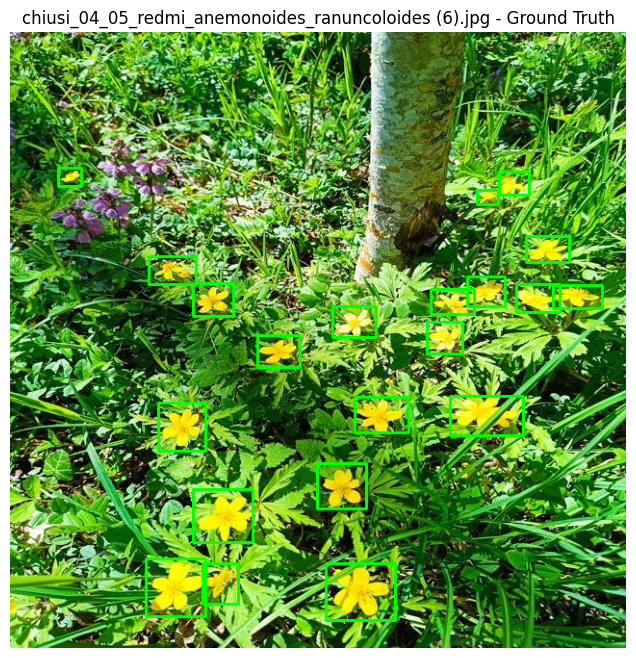

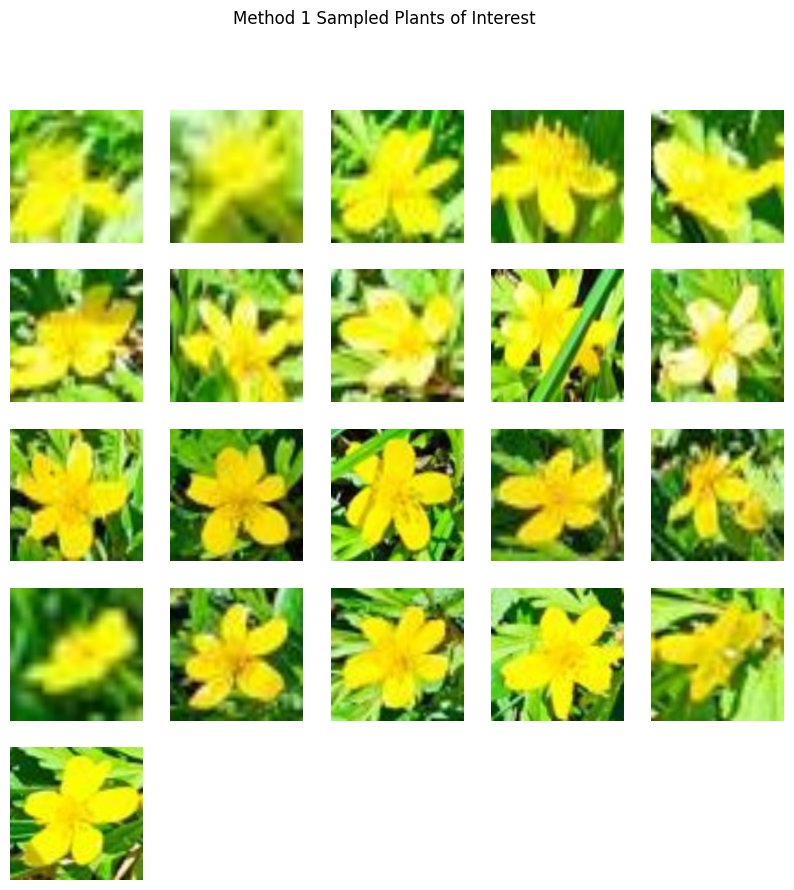

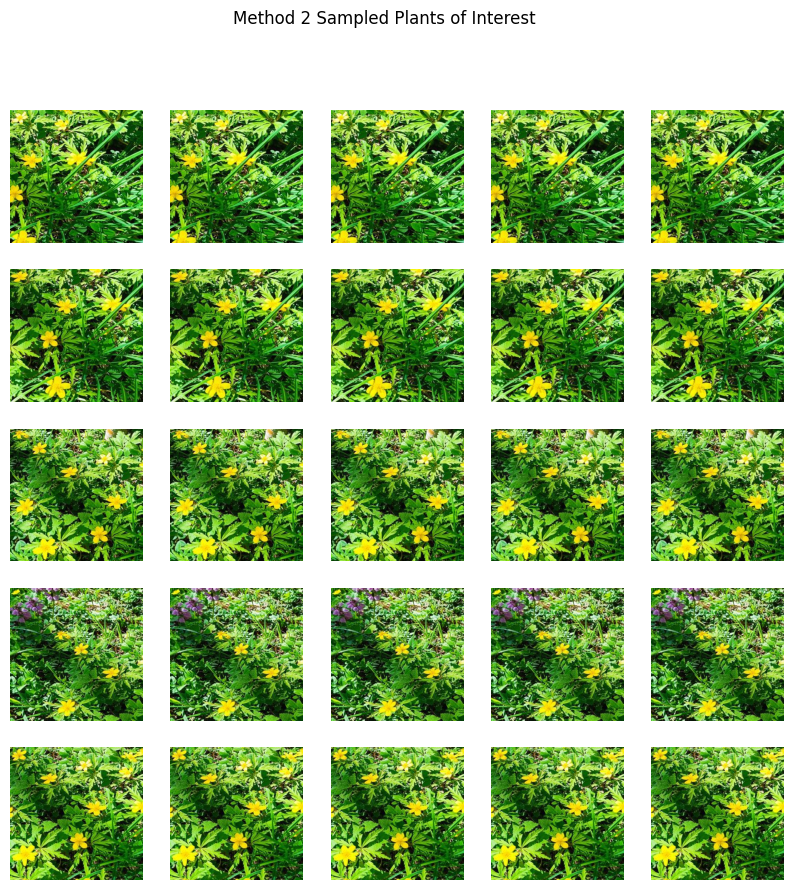

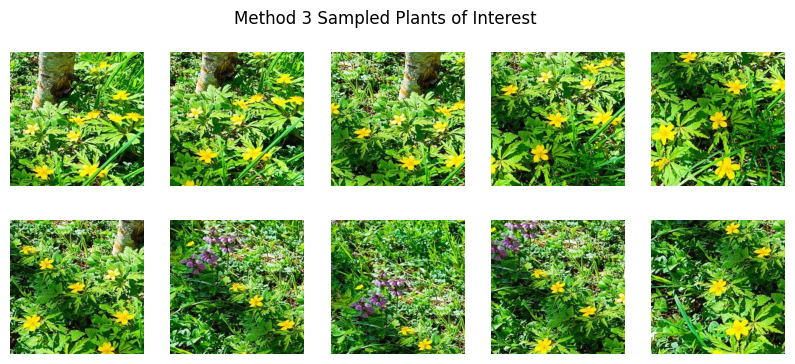

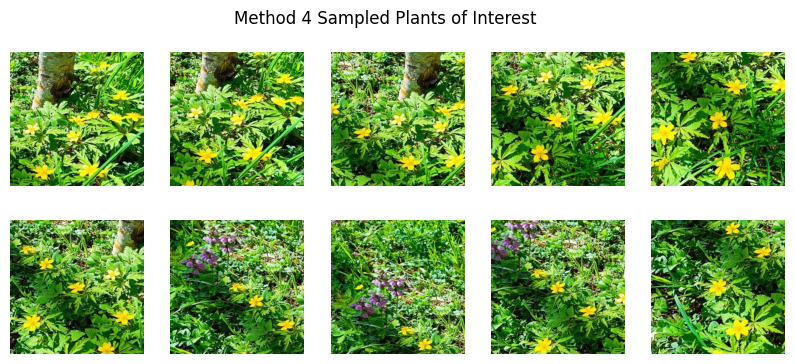

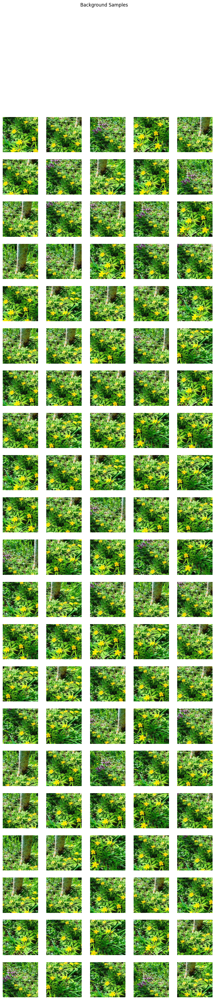

In [ ]:
# preview of the four window methods. show_boxes, resize_box, show_crops

crop = 50
labels = sorted([f for f in os.listdir(lbl_train) if f.endswith('.txt')])
if labels:
    name = random.choice(labels)
    lbl_path = os.path.join(lbl_train, name)
    img_name = name.replace('.txt', '.jpg')
    img_path = os.path.join(img_train, img_name)
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        H, W, _ = img.shape
        with open(lbl_path, 'r') as fh:
            rows = [line.strip().split() for line in fh]
            boxes = [
                (int(data[0]), to_px(*map(float, data[1:]), W, H))
                for data in rows
            ]
        show_boxes(img, [box for _, box in boxes], title=f"{img_name} - Ground Truth")
    for method in range(1, 5):
        samples = []
        for class_id, (X1, Y1, X2, Y2) in boxes:
            if method == 1:
                c = resize_box(img, X1, Y1, X2, Y2, crop)
                if c is not None:
                    samples.append(c)
            elif method == 2:
                count = 0
                tries = 50
                while count < 5 and tries > 0:
                    dx = random.randint(0, max(0, (X2 - X1) - crop))
                    dy = random.randint(0, max(0, (Y2 - Y1) - crop))
                    c = img[Y1+dy:Y1+dy+crop, X1+dx:X1+dx+crop]
                    if c.shape[:2] == (crop, crop):
                        samples.append(c)
                        count += 1
                    tries -= 1
            elif method == 3:
                mx, my = (X1 + X2) // 2, (Y1 + Y2) // 2
                cx1 = max(0, mx - crop // 2)
                cy1 = max(0, my - crop // 2)
                cx2 = cx1 + crop
                cy2 = cy1 + crop
                if cx2 <= W and cy2 <= H:
                    c = img[cy1:cy2, cx1:cx2]
                    if c.shape[:2] == (crop, crop):
                        samples.append(c)
            elif method == 4:
              if (X2 - X1 < crop + 10) and (Y2 - Y1 < crop + 10):
                  mx, my = (X1 + X2) // 2, (Y1 + Y2) // 2
                  cx1 = max(0, mx - crop // 2)
                  cy1 = max(0, my - crop // 2)
                  cx2 = cx1 + crop
                  cy2 = cy1 + crop
                  if cx2 <= W and cy2 <= H:
                      c = img[cy1:cy2, cx1:cx2]
                      if c.shape[:2] == (crop, crop):
                          samples.append(c)
        show_crops(samples, title=f"Method {method} Sampled Plants of Interest")
    negs = []
    tries_n = 0
    while len(negs) < len(boxes) * 5 and tries_n < 1000:
        rx = random.randint(0, W - crop)
        ry = random.randint(0, H - crop)
        box = [rx, ry, rx + crop, ry + crop]
        if all(iou(box, box) < 0.1 for _, box in boxes):
            c = img[ry:ry + crop, rx:rx + crop]
            negs.append(c)
        tries_n += 1
    show_crops(negs, title="Background Samples")
